<a href="https://colab.research.google.com/github/Createdd/computervision_ue/blob/main/anomaly_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

This is part of the exercise class "UE Computer Vision, Oliver Bimber / Indrajit Kurmi, 2021W" at the JKU Austria.

Please see the Github repository for more information: https://github.com/Createdd/computervision_ue 

Available on https://colab.research.google.com/drive/1UXrw17Lsbt-hsOIerbMG4JuFzpn73DWK

> Be aware that you would need to set up your google drive with the corresponding data if you like to use the google colab notebook!




 

# Google Colab related


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu Jan 20 17:31:52 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0    36W / 250W |  15981MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/MyDrive/cv_data

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/cv_data
time: 2.07 s (started: 2022-01-20 17:31:52 +00:00)


In [ ]:
# !apt install unzip
# !unzip ./data_WiSAR.zip -d .

%ls

data/  data_WiSAR.zip  integrated/  logs/  method.gdoc  model/  model_plot.png
time: 209 ms (started: 2022-01-20 17:31:54 +00:00)


# Data loading

In [ ]:
import torchvision
import torch
import matplotlib.pyplot as plt
import numpy as np

!pip install ipython-autotime

time: 3.11 s (started: 2022-01-20 17:31:55 +00:00)


## Load data


In [ ]:
from torchvision import datasets, transforms

# data_dir = './data'
data_dir = './integrated'

train_dir = data_dir + '/train'
validation_dir = data_dir + '/validation'
test_dir = data_dir + '/test'


train_transforms = transforms.Compose([
                                      transforms.ToTensor(),
                                       transforms.Normalize([0.5, 0.5, 0.5], 
                                                          [0.5, 0.5, 0.5])])

train_data = datasets.ImageFolder(train_dir, 
                                  transform=train_transforms)
test_data = datasets.ImageFolder(test_dir, 
                                 transform=train_transforms)
validation_data = datasets.ImageFolder(validation_dir, 
                                  transform=train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, 
                                           shuffle=True,
                                          batch_size=32)
test_loader = torch.utils.data.DataLoader(test_data, 
                                         batch_size=32)
validation_loader = torch.utils.data.DataLoader(validation_data, 
                                         batch_size=32)

time: 41.5 ms (started: 2022-01-20 17:31:58 +00:00)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


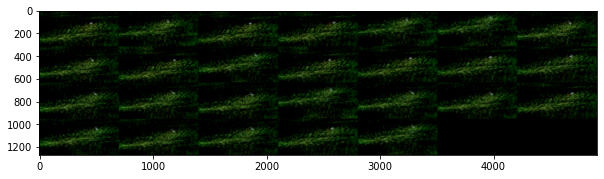

time: 1.95 s (started: 2022-01-20 17:31:58 +00:00)


In [ ]:
def imshow(img):
    plt.figure(figsize=(10,8))
    plt.imshow(img.permute(1,2,0))


image, labels = next(iter(train_loader))
imshow(torchvision.utils.make_grid(image,nrow=7))

## Build architecture

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

from tensorflow.keras.models import Model

target_size = (1024, 1024)
channel = (3,)
input_size = target_size + channel
batch_size=16

input = layers.Input(shape=input_size)


# Encoder
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)


# Autoencoder
# autoencoder.compile(optimizer="adam", loss="binary_crossentropy")


def SSIMLoss(y_true, y_pred):
  return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred,1.0))

# autoencoder = tf.keras.Model(inputs, outputs)
autoencoder = Model(input, x)
optimizer = tf.keras.optimizers.Adam(lr = 0.0005)
autoencoder.compile(optimizer=optimizer, loss=SSIMLoss)
# autoencoder = load_model('./model/autoencoder.h5')

autoencoder.summary()

# from keras.utils.vis_utils import plot_model
# plot_model(autoencoder, to_file='model_plot.png', show_shapes=True, show_layer_names=True) # for plotting architecture

Model: "model_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1024, 1024, 3)]   0         
                                                                 
 conv2d_3 (Conv2D)           (None, 1024, 1024, 32)    896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 512, 512, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 512, 512, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 256, 256, 32)     0         
 2D)                                                             
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 512, 512, 32)     924

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
# todo create params and pass over variables
from keras.preprocessing.image import ImageDataGenerator

# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator#flow_from_directory

data_gen = ImageDataGenerator(rescale=1 / 255)

train_generator = data_gen.flow_from_directory(
    train_dir, 
    target_size = target_size,
    # classes=['1','2'],
    # color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)#256)

test_generator = data_gen.flow_from_directory(
    test_dir, 
    target_size = target_size, 
    # color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)

validation_generator = data_gen.flow_from_directory(
    validation_dir, 
    target_size = target_size, 
    # color_mode='grayscale', 
    class_mode='input', 
    batch_size=batch_size)



Found 26 images belonging to 26 classes.
Found 13 images belonging to 13 classes.
Found 11 images belonging to 11 classes.
time: 331 ms (started: 2022-01-20 17:32:00 +00:00)


In [ ]:
test_generator.samples

13

time: 4.42 ms (started: 2022-01-20 17:32:00 +00:00)


In [ ]:
%load_ext tensorboard
%reload_ext tensorboard

from keras.callbacks import TensorBoard
import tensorflow as tf
import datetime, os

## remove old logs
import shutil
shutil.rmtree("logs", ignore_errors=False)
###

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
time: 22.9 ms (started: 2022-01-20 17:32:00 +00:00)


In [ ]:
# https://keras.io/api/models/model_training_apis/
# %load_ext autotime

# hist=autoencoder.fit(
#                 x = train_generator,
#                 epochs=100,
#                 #batch_size=128, # doesnt need to be specified when generator is used
#                 #shuffle=True,
#                 validation_data=(validation_generator),
#                 callbacks=[tensorboard_callback]
#                 )


# autoencoder.save('./model/autoencoder.h5')
autoencoder = keras.models.load_model('./model/autoencoder.h5')

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
Epoch 1/100
2/2 [==============================] - 4s 2s/step - loss: 0.2251 - val_loss: 0.1965
Epoch 2/100
2/2 [==============================] - 2s 2s/step - loss: 0.2176 - val_loss: 0.1939
Epoch 3/100
2/2 [==============================] - 3s 1s/step - loss: 0.2161 - val_loss: 0.1935
Epoch 4/100
2/2 [==============================] - 2s 2s/step - loss: 0.2158 - val_loss: 0.1933
Epoch 5/100
2/2 [==============================] - 2s 2s/step - loss: 0.2156 - val_loss: 0.1931
Epoch 6/100
2/2 [==============================] - 2s 2s/step - loss: 0.2154 - val_loss: 0.1931
Epoch 7/100
2/2 [==============================] - 3s 1s/step - loss: 0.2154 - val_loss: 0.1929
Epoch 8/100
2/2 [==============================] - 2s 2s/step - loss: 0.2152 - val_loss: 0.1927
Epoch 9/100
2/2 [==============================] - 2s 2s/step - loss: 0.2150 - val_loss: 0.1925
Epoch 10/100
2/2 [==============================] - 

In [ ]:
# Used for debugging Model
# %tensorboard --logdir logs
# ## notebook.display(port=6006, height=1000) 

# from tensorboard import notebook
# notebook.list()

time: 1.57 ms (started: 2022-01-20 17:36:13 +00:00)


In [ ]:
predictions = autoencoder.predict(validation_generator)
decoded_imgs = predictions

time: 989 ms (started: 2022-01-20 17:36:13 +00:00)


In [ ]:
def display(array1, array2, target_size=(28,28)):
    """
    Displays ten random images from each one of the supplied arrays.
    """

    n = 10

    indices = np.random.randint(len(array1), size=n)
    images1 = array1[indices, :]
    images2 = array2[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(image1.reshape(target_size))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(image2.reshape(target_size))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()


time: 12.7 ms (started: 2022-01-20 17:36:14 +00:00)


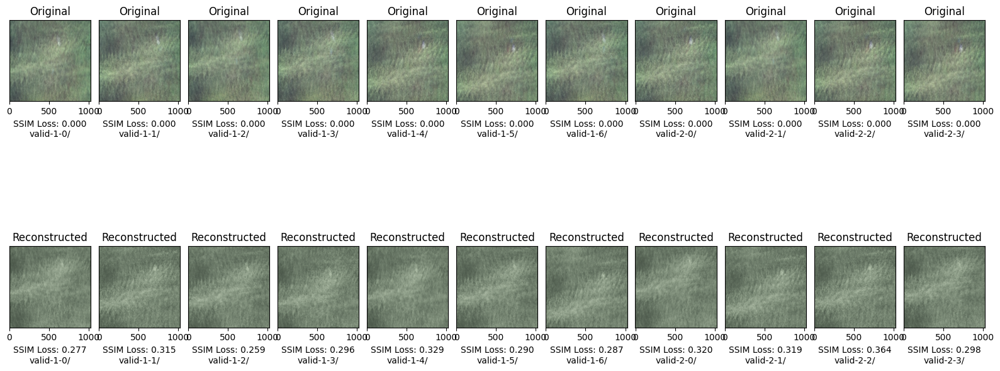

time: 8.88 s (started: 2022-01-20 17:36:14 +00:00)


In [ ]:
plt.figure(figsize=(20, 14), dpi=100)
plt.subplots_adjust( wspace=0.1, hspace=0.07)
plt_a=1

n=11
for i in range(n):

    gen_file_name = validation_generator.filenames[i]
    img = next(validation_generator)[0][i]
    loss_orig = SSIMLoss(img,img) 
    loss_reconstructed = SSIMLoss(img,predictions[i]) 

    # Original training dataset vs Original training
    ax = plt.subplot(3, n, plt_a)
    
    # img = Image.fromarray(img, 'RGB').resize(target_size)
    # img = cv2.resize(img, dsize=target_size, interpolation=cv2.INTER_CUBIC)
    plt.imshow(img)
    # plt.imshow(img.reshape(target_size))
    # plt.imshow(np.expand_dims(img, axis=0).reshape(target_size))#, cmap='jet')
    ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(False)
    # value_a = SSIMLoss(next(test_generator)[0][i], next(test_generator)[0][i]) # loss should be zero
    ax.set_title(f"Original")
    label = f'SSIM Loss: {loss_orig:.3f}\n{gen_file_name[:10]}'
    ax.set_xlabel(label)
    
    # Reconstructed good data  vs Original training data
    ax = plt.subplot(3, n, plt_a + n )
    # plt.imshow(predictions[i].reshape(target_size))
    plt.imshow(predictions[i])
    ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(False) 

    ax.set_title(f"Reconstructed")
    label = f'SSIM Loss: {loss_reconstructed:.3f}\n{gen_file_name[:10]}'
    ax.set_xlabel(label)
  
    plt_a+=1
plt.show()

In [ ]:
!pip install keract
from keract import get_activations

input_sample = next(validation_generator)[0][10]
input_sample_expanded = np.expand_dims(input_sample, axis=0)

activations = get_activations(autoencoder, input_sample_expanded, nested=True)
for layer_name, acts in activations.items():
        print(layer_name, acts.shape,'\n', end=' ')

input_2 (1, 1024, 1024, 3) 
 conv2d_3 (1, 1024, 1024, 32) 
 max_pooling2d_2 (1, 512, 512, 32) 
 conv2d_4 (1, 512, 512, 32) 
 max_pooling2d_3 (1, 256, 256, 32) 
 conv2d_transpose_2 (1, 512, 512, 32) 
 conv2d_transpose_3 (1, 1024, 1024, 32) 
 conv2d_5 (1, 1024, 1024, 3) 
 time: 3.46 s (started: 2022-01-20 17:36:23 +00:00)


valid-2-1/cropped_image_all.png
3


<Figure size 960x640 with 0 Axes>

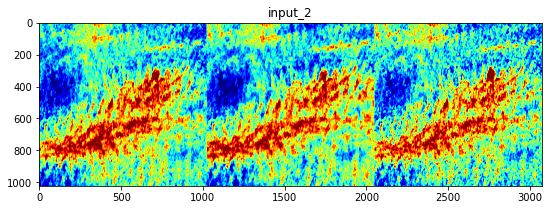

32


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in true_divide


<Figure size 960x640 with 0 Axes>

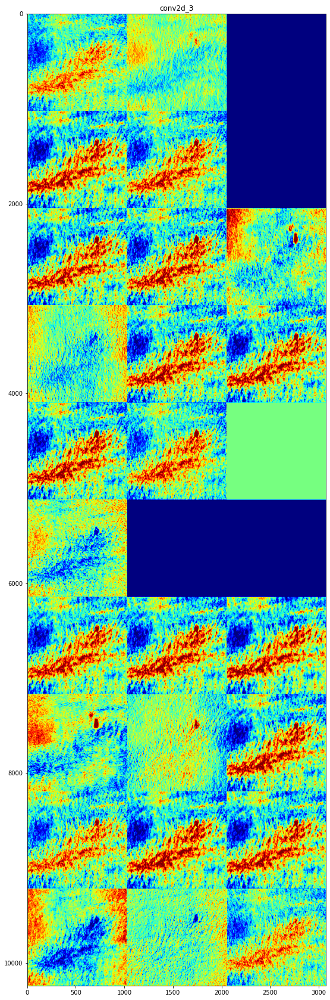

32


<Figure size 960x640 with 0 Axes>

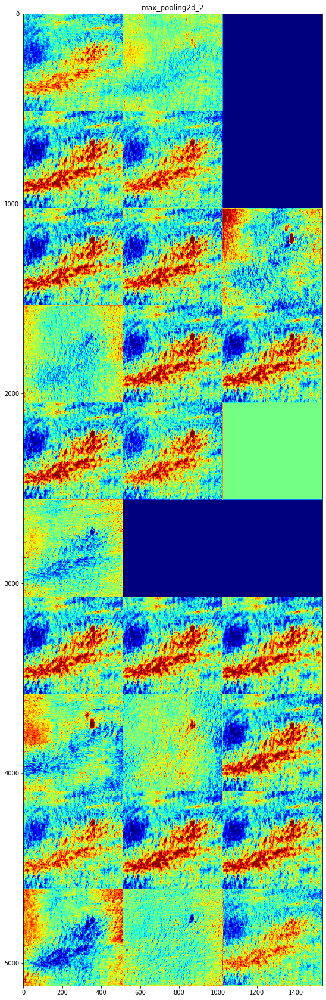

32


<Figure size 960x640 with 0 Axes>

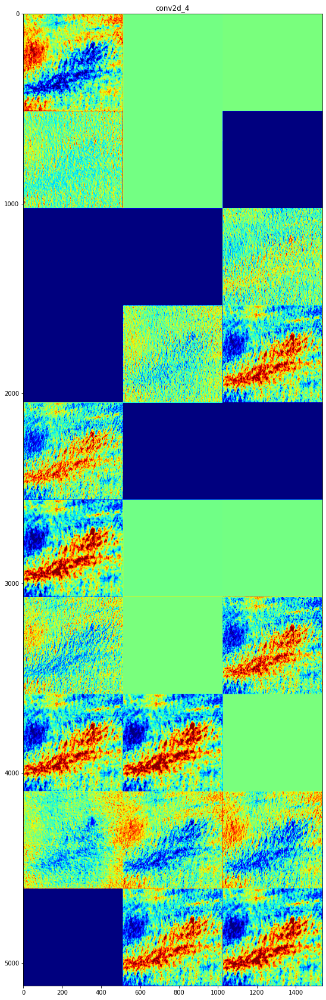

32


<Figure size 960x640 with 0 Axes>

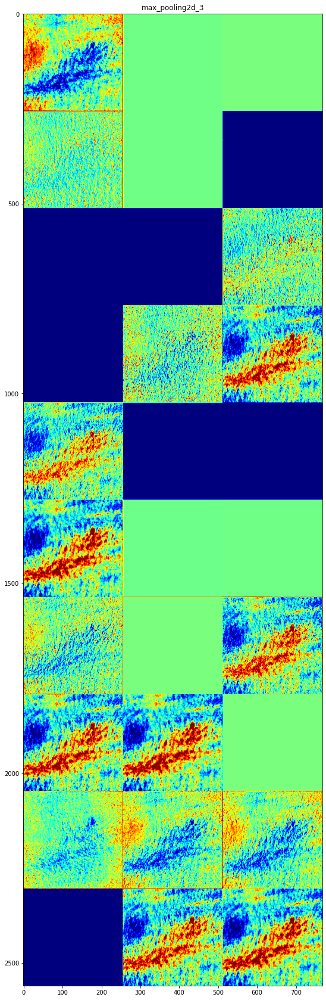

32


<Figure size 960x640 with 0 Axes>

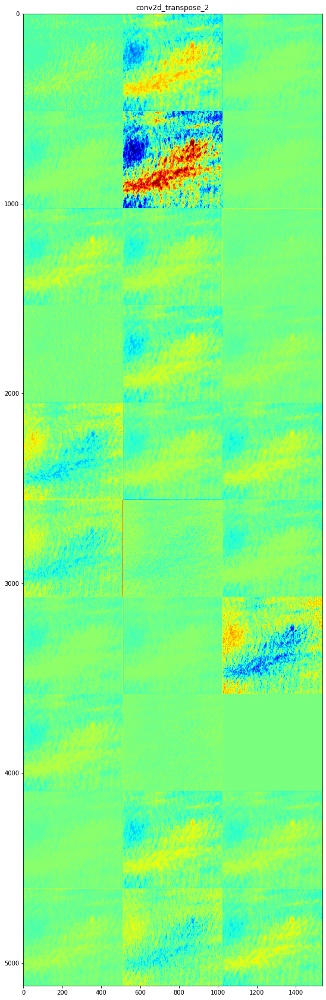

32


<Figure size 960x640 with 0 Axes>

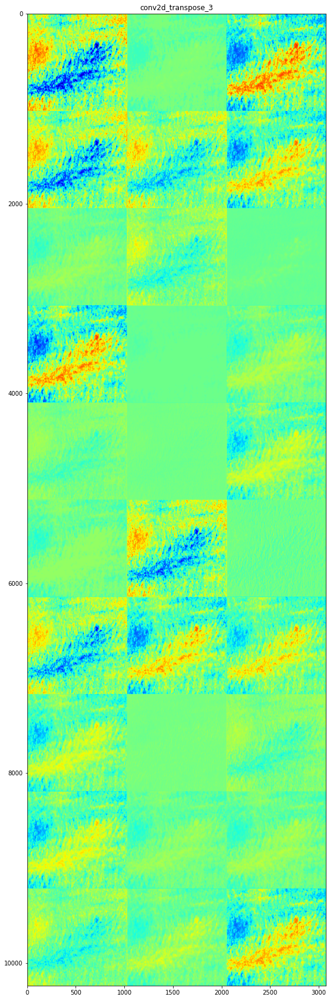

3


<Figure size 960x640 with 0 Axes>

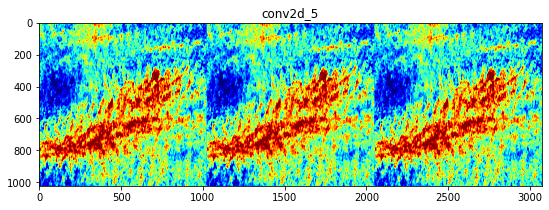

time: 19.1 s (started: 2022-01-20 17:36:26 +00:00)


In [ ]:
# https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0 

from matplotlib.pyplot import figure


layer_names = []
for layer in autoencoder.layers[:12]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot


activations = get_activations(autoencoder, next(validation_generator)[0][-2:-1], nested=True)
all_acts = list(activations.items())
activations = all_acts#[-2:]
print(validation_generator.filenames[8])
    
images_per_row = 3

for layer_name, layer_activation in activations: # Displays the feature maps
    figure(figsize=(12, 8), dpi=80)
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    print(n_features)

    if n_features > 1:
      n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
      display_grid = np.zeros((size * n_cols, images_per_row * size))
      
      
      for col in range(n_cols): # Tiles each filter into a big horizontal grid
          for row in range(images_per_row):
              channel_image = layer_activation[0,
                                              :, :,
                                              col * images_per_row + row]
              channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, # Displays the grid
                          row * size : (row + 1) * size] = channel_image
      scale = 3. / size 
      plt.figure(figsize=(scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='jet')
      plt.show()

    else:

      plt.imshow(np.expand_dims(last_act[0,:,:,1], axis=0).reshape(target_size), cmap='jet')
      plt.title(layer_name)
      plt.show()

valid-1-0/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


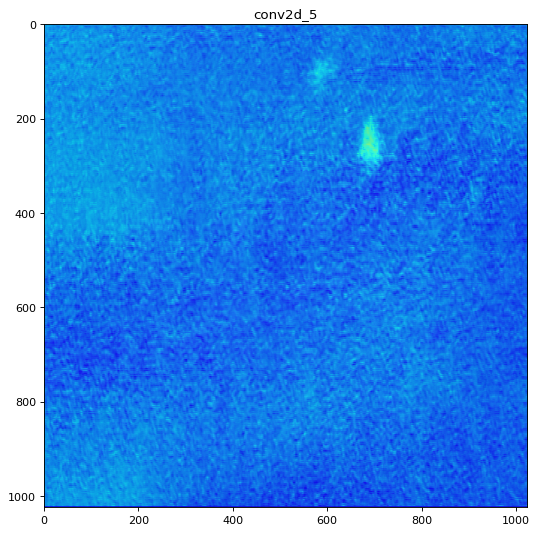

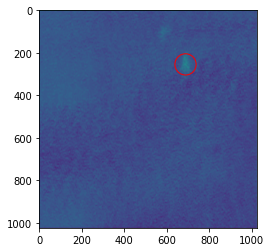

valid-1-1/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


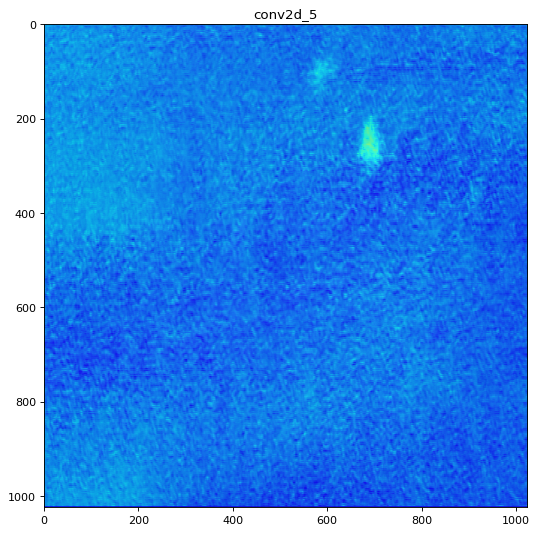

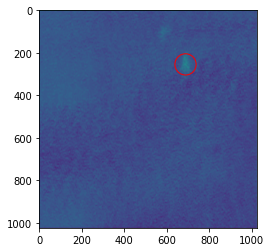

valid-1-2/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


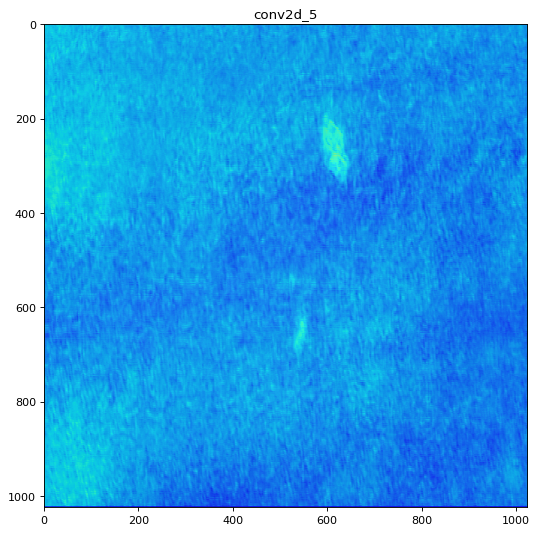

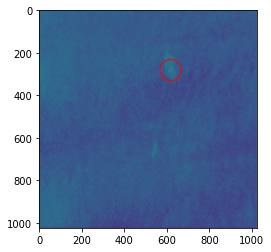

valid-1-3/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


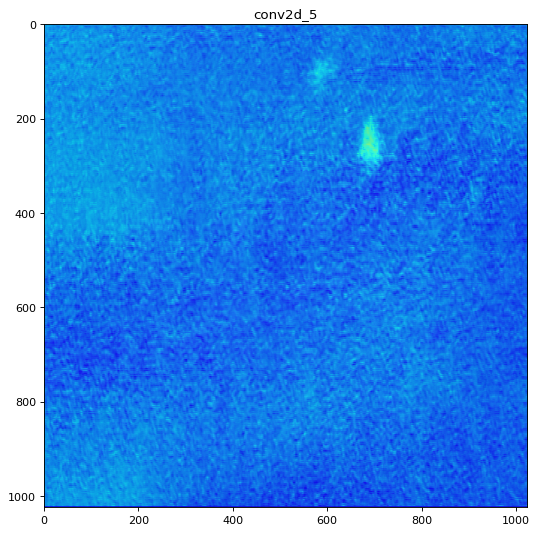

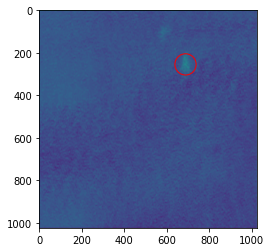

valid-1-4/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


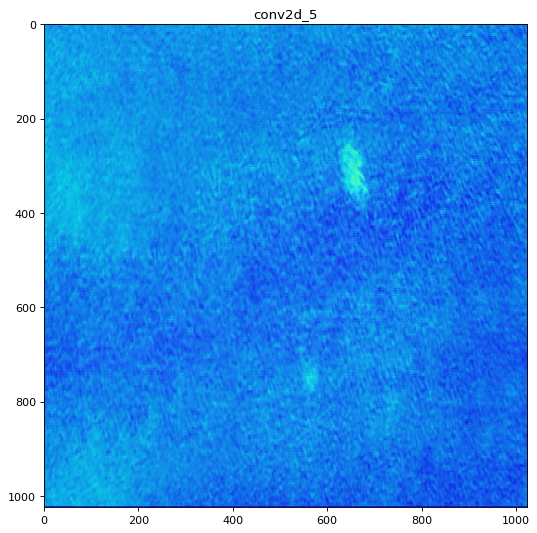

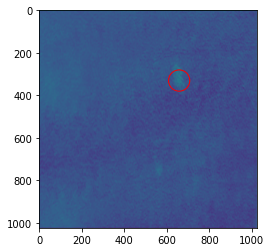

valid-1-5/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


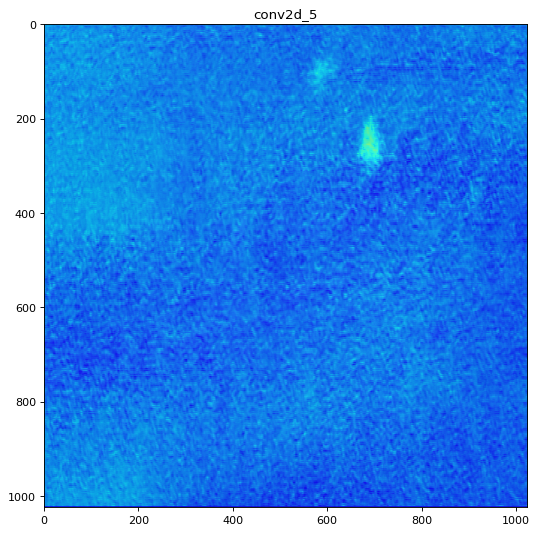

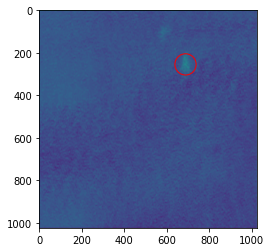

valid-1-6/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


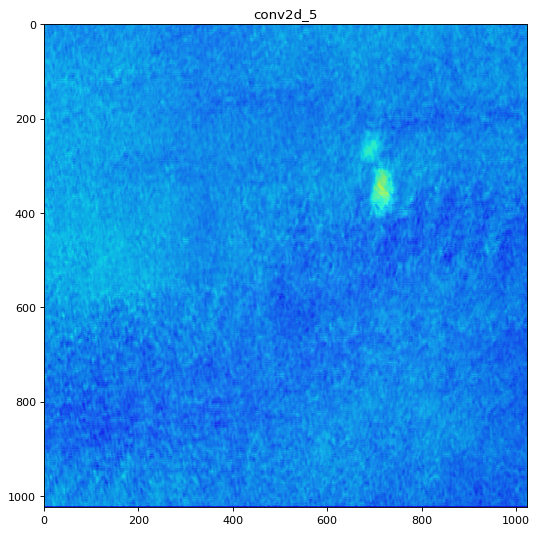

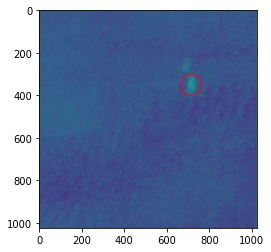

valid-2-0/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


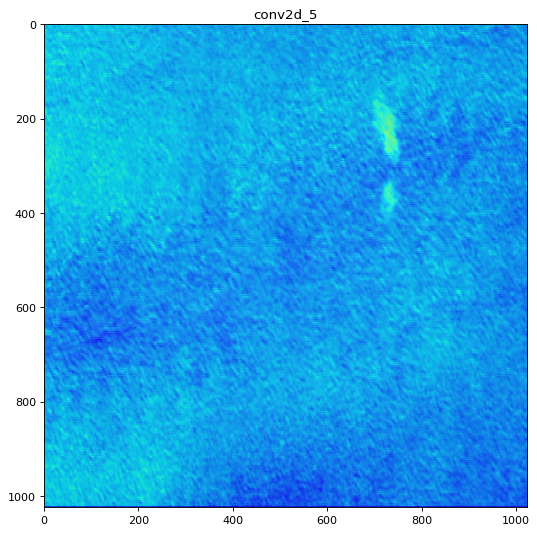

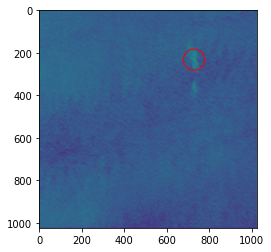

valid-2-1/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


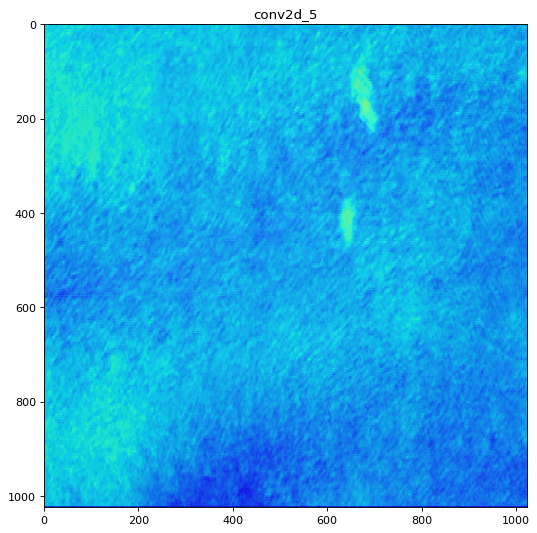

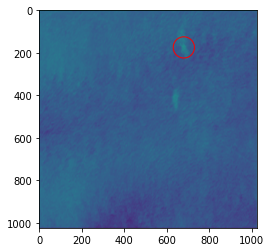

valid-2-2/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


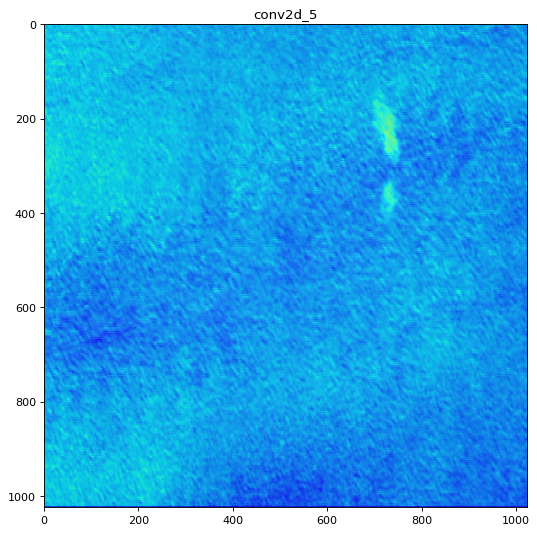

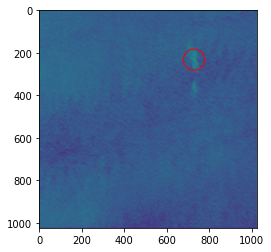

valid-2-3/cropped_image_all.png
conv2d_3 (1, 1024, 1024, 32)


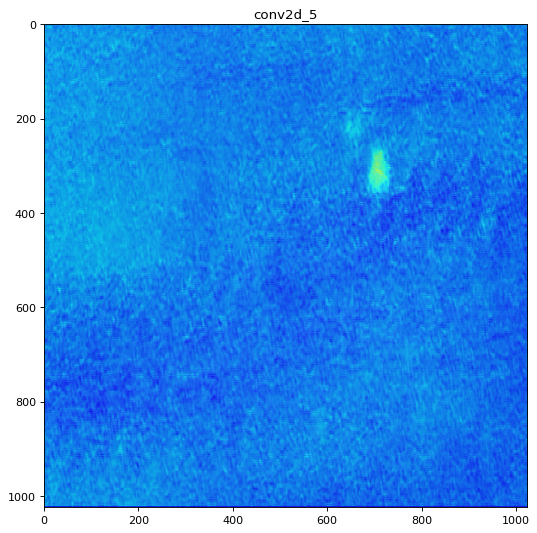

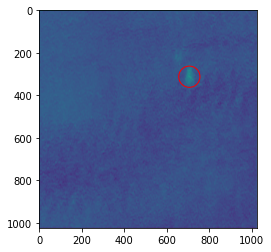

time: 15 s (started: 2022-01-20 17:38:57 +00:00)


In [39]:
import cv2
import matplotlib.patches as patches

def draw_circles(img):
    radius = 41
    g_blured = cv2.GaussianBlur(img, (radius, radius), 0)
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(g_blured)
  
    fig, ax = plt.subplots()
    ax.imshow(img)
    circ = patches.Circle((maxLoc), 50, color='red', fill=False)
    ax.add_patch(circ)

    plt.show()



def plot_activation(img):
    img_expanded = np.expand_dims(img, axis=0)

    activations = get_activations(autoencoder, img, nested=True)
    all_acts = list(activations.items())
    last_act_tuple = all_acts[1] # taking the conv2d layer
    last_layer, last_act = last_act_tuple
    print(last_layer, last_act.shape)
    channel_highest_location = 21 # -> manually defined by looking at the activation images

  
    activation_img = np.expand_dims(last_act[0,:,:,channel_highest_location], axis=0)

    figure(figsize=(12, 8), dpi=80)
    plt.imshow(np.squeeze(img_expanded))
    plt.imshow(np.squeeze(activation_img), cmap='jet', alpha=0.85) # taking the 25th channel for showing humans 
    # plt.imshow(np.squeeze(np.expand_dims(last_act[0,:,:,23:26], axis=0)))

    plt.title(layer_name)
    plt.show()

    draw_circles(np.squeeze(np.expand_dims(last_act[0,:,:,channel_highest_location], axis=0)))

    # ax.imshow(np.squeeze(activation_img), cmap='jet', alpha=0.85) # taking the 25th channel for showing humans 



for i in range(validation_generator.samples):
  nr_img = i
  input_sample = next(validation_generator)[0][nr_img]
  input_sample = np.expand_dims(input_sample, axis=0)
  print(validation_generator.filenames[nr_img])
  plot_activation(input_sample)

# Resources

## Research regarding autoencoder for anomaly detection

- Morales-Forero, A., & Bassetto, S. (2019, December). Case Study: A Semi-Supervised Methodology for Anomaly Detection and Diagnosis. In 2019 IEEE International Conference on Industrial Engineering and Engineering Management (IEEM) (p. 4) (pp. 1031-1037). IEEE.

- Sakurada, M., & Yairi, T. (2014, December). Anomaly detection using autoencoders with nonlinear dimensionality reduction. In Proceedings of the MLSDA 2014 2nd Workshop on Machine Learning for Sensory Data Analysis (p. 4). ACM.

- An, J., & Cho, S. (2015). Variational autoencoder based anomaly detection using reconstruction probability. Special Lecture on IE, 2, 1-18.

- Zhou, C., & Paffenroth, R. C. (2017, August). Anomaly detection with robust deep autoencoders. In Proceedings of the 23rd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining (pp. 665-674). ACM.

- Ribeiro, Manassés; Lazzaretti, André Eugênio; Lopes, Heitor Silvério (2018). "A study of deep convolutional auto-encoders for anomaly detection in videos". Pattern Recognition Letters. 105: 13–22. doi:10.1016/j.patrec.2017.07.016 

- Nalisnick, Eric; Matsukawa, Akihiro; Teh, Yee Whye; Gorur, Dilan; Lakshminarayanan, Balaji (2019-02-24). "Do Deep Generative Models Know What They Don't Know?". arXiv:1810.09136

- Xiao, Zhisheng; Yan, Qing; Amit, Yali (2020). "Likelihood Regret: An Out-of-Distribution Detection Score For Variational Auto-encoder". Advances in Neural Information Processing Systems. 33. arXiv:2003.02977



## Implementation related

Some of the resources that have been used through the implementaion

- https://anomagram.fastforwardlabs.com/#/
- https://benjoe.medium.com/anomaly-detection-using-pytorch-autoencoder-and-mnist-31c5c2186329
- https://blog.keras.io/building-autoencoders-in-keras.html
- https://docs.opencv.org/3.4/d7/d4d/tutorial_py_thresholding.html
- https://github.com/SubhamIO/AnomalyDetection---Deep-AUTOENCODERS/blob/main/AnamolydetectionAE.ipynb
- https://github.com/cerlymarco/MEDIUM_NoteBook/blob/master/Anomaly_Detection_Image/Anomaly_Detection_Image.ipynb
- https://github.com/olonok69/Survival-Analisys/blob/master/Anomaly_Detection_Image.ipynb
- https://keras.io/examples/vision/autoencoder/
- https://medium.com/analytics-vidhya/anomaly-detection-in-images-autoencoders-b780abf88f51
- https://medium.com/analytics-vidhya/image-anomaly-detection-using-autoencoders-ae937c7fd2d1
- https://medium.com/analytics-vidhya/unsupervised-learning-and-convolutional-autoencoder-for-image-anomaly-detection-b783706eb59e
- https://stackoverflow.com/questions/57614072/visualizing-layers-of-autoencoder
- https://towardsdatascience.com/anomaly-detection-in-images-777534980aeb
- https://towardsdatascience.com/anomaly-detection-using-autoencoders-5b032178a1ea
- https://towardsdatascience.com/hands-on-anomaly-detection-with-variational-autoencoders-d4044672acd5
- https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0 
- https://www.machinecurve


In [ ]:

# unused
# show similarity differences


# from skimage.metrics import structural_similarity as compare_ssim
# import imutils
# import cv2
# from google.colab.patches import cv2_imshow

# print(len(validation_generator.filenames))
# nr_img = 10

# gen_file_name = validation_generator.filenames[nr_img]
# img = next(validation_generator)[0][nr_img]

# a_img = img
# b_img =predictions[1]

# a_img = cv2.cvtColor(a_img, cv2.COLOR_BGR2GRAY)
# b_img = cv2.cvtColor(b_img, cv2.COLOR_BGR2GRAY)

# a = np.squeeze(a_img)
# b = np.squeeze(b_img)

# loss_orig = SSIMLoss(img,img) 
# loss_reconstructed = SSIMLoss(img,predictions[nr_img])


# (score, diff) = compare_ssim(a, b, full=True)
# diff = (diff * 255).astype("uint8")


# thresh = cv2.threshold(diff, 0, 255,
# 	#  cv2.THRESH_BINARY_INV |
#   #  cv2.THRESH_OTSU)[1]
#   cv2.THRESH_BINARY)[1]
#   # cv2.THRESH_TRUNC)[1]
# cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
# 	cv2.CHAIN_APPROX_SIMPLE)
# cnts = imutils.grab_contours(cnts)

# print(f'SSIM: {score} \n Diff: {diff}')#' \n {thresh} \n {cnts}')

# # loop over the contours
# for c in cnts:
# 	# compute the bounding box of the contour and then draw the
# 	# bounding box on both input images to represent where the two
# 	# images differ
# 	(x, y, w, h) = cv2.boundingRect(c)
# 	cv2.rectangle(a_img, (x, y), (x + w, y + h), (0, 0, 255), 2)
# 	cv2.rectangle(b_img, (x, y), (x + w, y + h), (0, 0, 255), 2)
# # show the output images
# plt.figure(figsize=(12, 8), dpi=80)
# plt.title(gen_file_name)
# plt.imshow(np.expand_dims(b_img, axis=0).reshape(target_size), cmap='jet')

# # cv2_imshow(a_img)
# # cv2_imshow(b_img)
# cv2_imshow(diff)
# cv2_imshow(thresh)




time: 7.15 ms (started: 2022-01-20 17:36:59 +00:00)
